In [45]:
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!mv shape_predictor_68_face_landmarks.dat.bz2 ./models
!bzip2 -d ./models/shape_predictor_68_face_landmarks.dat.bz2

--2025-04-10 06:47:39--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2 [following]
--2025-04-10 06:47:39--  https://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Connecting to dlib.net (dlib.net)|107.180.26.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  38.8MB/s    in 1.6s    

2025-04-10 06:47:42 (38.8 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]

bzip2: Output file ./models/shape_predictor_68_face_landmarks.dat already exists.


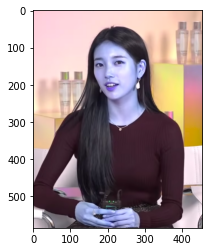

In [6]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import dlib

# 이미지 불러오기
my_image_path = './images/img.png'
img_bgr = cv2.imread(my_image_path)
img_show = img_bgr.copy()
plt.imshow(img_bgr)
plt.show()

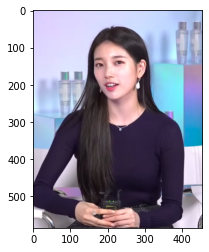

In [92]:
# 이미지 rgb 순서 바꾸어서 출력
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

In [93]:
# HOG(Histogram of Oriented Gradients) 이미지 색상 변화량
detector_hog = dlib.get_frontal_face_detector()

# bounding box 추출
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
dlib_rects = detector_hog(img_rgb, 1)

rectangles[[(139, 96) (268, 225)]]


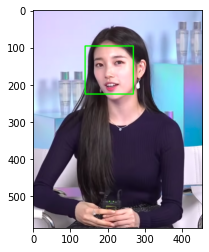

In [94]:
print(dlib_rects)                # 찾은 얼굴 영역 박스 리스트 

for dlib_rect in dlib_rects:    # 찾은 얼굴 영역의 좌표
    l = dlib_rect.left()        # 왼쪽
    t = dlib_rect.top()         # 위쪽
    r = dlib_rect.right()       # 오른쪽
    b = dlib_rect.bottom()      # 아래쪽

    cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA) # bounding box 그림

img_show_rgb =  cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

In [95]:
# landmark 모델 불러오기
model_path = './models/shape_predictor_68_face_landmarks.dat'
landmark_predictor = dlib.shape_predictor(model_path)

In [96]:
list_landmarks = []   # 랜드마크 위치 리스트

# object keypoint estimation
# face landmark 찾기(이목구비 위치 찾기)
for dlib_rect in dlib_rects:
    points = landmark_predictor(img_rgb, dlib_rect)
    list_points = list(map(lambda p: (p.x, p.y), points.parts()))
    list_landmarks.append(list_points)

print(len(list_landmarks[0]))

68


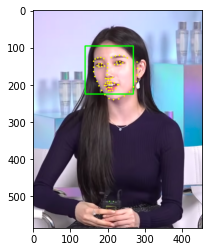

In [97]:
# 찾은 랜드마크 이미지에 표시
for landmark in list_landmarks:
    for point in landmark:
        cv2.circle(img_show, point, 2, (0, 255, 255), -1)   # 원 그리기

# 이미지 출력
img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
plt.imshow(img_show_rgb)
plt.show()

In [98]:
# 이미지에서 코 중심점 좌표 구하기
for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
    print (landmark[30]) 
    x = landmark[30][0] 
    y = landmark[30][1] - dlib_rect.height()//2 
    w = h = dlib_rect.width() 
    print (f'(x,y) : ({x},{y})')
    print (f'(w,h) : ({w},{h})')

(198, 173)
(x,y) : (198,108)
(w,h) : (130,130)


In [99]:
# 스티커 이미지 가져오기
sticker_path = './images/cat-whiskers.png' 
img_sticker = cv2.imread(sticker_path) 
img_sticker = cv2.resize(img_sticker, (w,h)) 
print (img_sticker.shape)

(130, 130, 3)


In [100]:
# 원본이미지에 맞게 스티커 이미지 좌표 조정
refined_x = x - w // 2
refined_y = y

print (f'(x,y) : ({refined_x},{refined_y})')

(x,y) : (133,108)


In [101]:
# 원본이미지 벗어날 경우 예외처리
if refined_x < 0: 
    img_sticker = img_sticker[:, -refined_x:]
    refined_x = 0
    
if refined_y < 0:
    img_sticker = img_sticker[-refined_y:, :]  
    refined_y = 0

print (f'(x,y) : ({refined_x},{refined_y})')

(x,y) : (133,108)


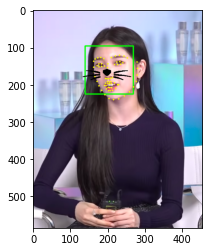

In [102]:
# 원본이미지에서 스티커를 적용할 부분만 크롭
sticker_area = img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]

# 스티커 적용
img_show[refined_y:refined_y+img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==0,img_sticker,sticker_area).astype(np.uint8)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

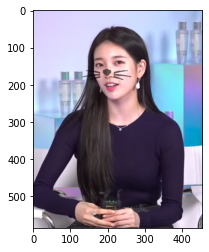

In [110]:
# 바운딩 박스와 랜드마크 제거 후 최종 출력
# 원본이미지 크롭
sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]

# 원본이미지와 스티커이미지 적절히 섞기
blended = cv2.addWeighted(img_sticker, 0.6, sticker_area, 0.4, 0)

# 스티커 적용
img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
    np.where(img_sticker==0,blended,sticker_area).astype(np.uint8)

plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.show()

### 다양한 사진으로 테스트

In [7]:
import traceback
import time

def img_load(file_path):
    # 이미지 불러오기
    img_bgr = cv2.imread(file_path)
    img_show = img_bgr.copy()
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.show()
    
    return img_bgr

def sticker_test(img_bgr):
    # bounding box 추출
    detector_hog = dlib.get_frontal_face_detector()
    img_show = img_bgr.copy()
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    dlib_rects = detector_hog(img_rgb, 1)
    print(dlib_rects)

    # bounding box 그리기
    for dlib_rect in dlib_rects:
        l = dlib_rect.left()
        t = dlib_rect.top() 
        r = dlib_rect.right() 
        b = dlib_rect.bottom()
        cv2.rectangle(img_show, (l,t), (r,b), (0,255,0), 2, lineType=cv2.LINE_AA)

    # 랜드마크 찾기
    model_path = './models/shape_predictor_68_face_landmarks.dat'
    landmark_predictor = dlib.shape_predictor(model_path)
    list_landmarks = []
    for dlib_rect in dlib_rects:
        points = landmark_predictor(img_rgb, dlib_rect)
        list_points = list(map(lambda p: (p.x, p.y), points.parts()))
        list_landmarks.append(list_points)
        
    # 랜드마크 못 찾았을 때 예외처리-----------------------------------------------------------------
    try:
        print(len(list_landmarks[0]))
    except:
        print("no landmark")
        traceback.print_exc()   # 에러 출력
        time.sleep(2)           # 에러가 다음 이미지 테스트 시작 후 출력되어서 출력될 때까지 잠시 대기
        return 0
    # ------------------------------------------------------------------------------------------------
    
    for landmark in list_landmarks:
        for point in landmark:
            cv2.circle(img_show, point, 2, (0, 255, 255), -1)
        
    plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
    plt.show()
        
    # 이미지에서 코 중심점 좌표 구하기
    for dlib_rect, landmark in zip(dlib_rects, list_landmarks):
        print (landmark[30]) 
        x = landmark[30][0] 
        y = landmark[30][1] - dlib_rect.height()//2 
        w = h = dlib_rect.width() 
        print (f'(x,y) : ({x},{y})')
        print (f'(w,h) : ({w},{h})')
        
    # 스티커 이미지 가져오기
    sticker_path = './images/cat-whiskers.png' 
    img_sticker = cv2.imread(sticker_path) 
    img_sticker = cv2.resize(img_sticker, (w,h)) 
    print (img_sticker.shape)

    # 원본이미지에 맞게 스티커 이미지 좌표 조정
    refined_x = x - w // 2
    refined_y = y
    if refined_x < 0: 
        img_sticker = img_sticker[:, -refined_x:]
        refined_x = 0
    
    if refined_y < 0:
        img_sticker = img_sticker[-refined_y:, :]  
        refined_y = 0

    # 스티커 적용
    sticker_area = img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]]
    blended = cv2.addWeighted(img_sticker, 0.6, sticker_area, 0.4, 0)
    img_bgr[refined_y:refined_y +img_sticker.shape[0], refined_x:refined_x+img_sticker.shape[1]] = \
        np.where(img_sticker==0,blended,sticker_area).astype(np.uint8)

    plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
    plt.show()
    
    return 1

./images/test1.jpg


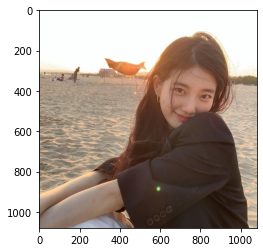

rectangles[[(587, 320) (854, 587)]]
68


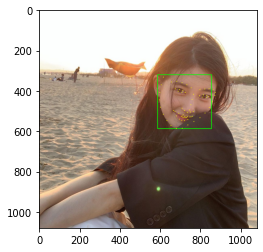

(746, 495)
(x,y) : (746,361)
(w,h) : (268,268)
(268, 268, 3)


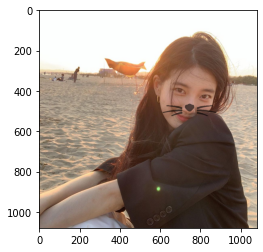

./images/test2.jpg


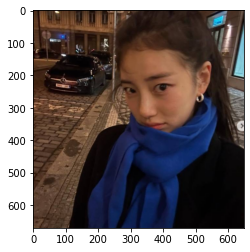

rectangles[[(230, 142) (498, 409)]]
68


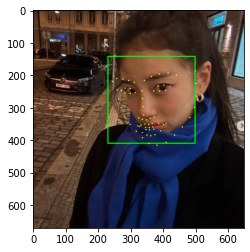

(339, 322)
(x,y) : (339,188)
(w,h) : (269,269)
(269, 269, 3)


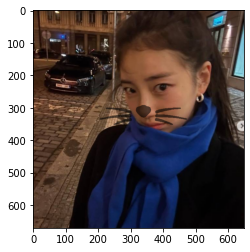

./images/test3.jpg


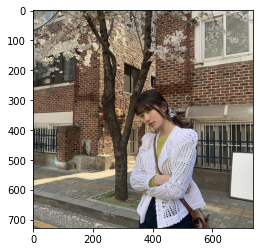

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_152/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/test4.jpg


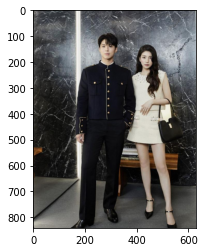

rectangles[[(252, 122) (315, 184)], [(412, 170) (463, 222)]]
68


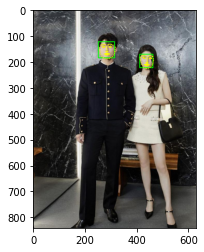

(285, 153)
(x,y) : (285,122)
(w,h) : (64,64)
(441, 199)
(x,y) : (441,173)
(w,h) : (52,52)
(52, 52, 3)


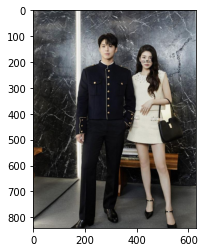

./images/test5.jpg


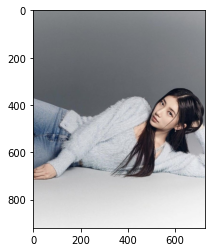

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_152/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/test6.jpg


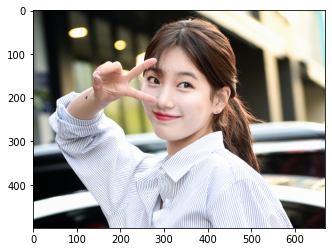

rectangles[[(221, 98) (407, 284)]]
68


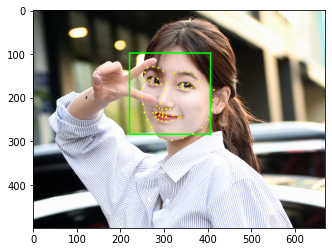

(293, 211)
(x,y) : (293,118)
(w,h) : (187,187)
(187, 187, 3)


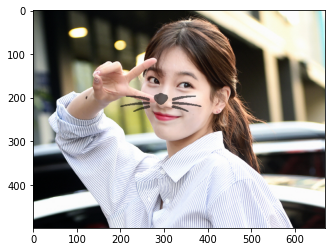

./images/test7.jpg


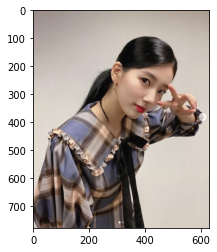

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_152/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/test8.jpg


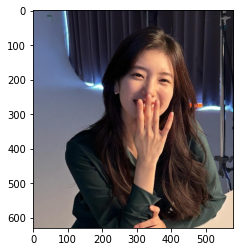

rectangles[[(242, 139) (428, 325)]]
68


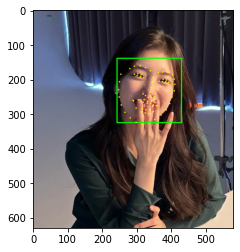

(337, 238)
(x,y) : (337,145)
(w,h) : (187,187)
(187, 187, 3)


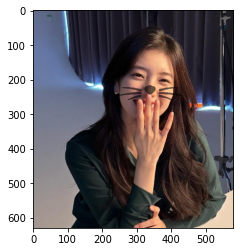

./images/test9.jpg


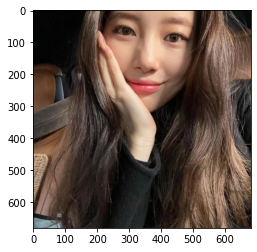

rectangles[[(205, -44) (526, 313)]]
68


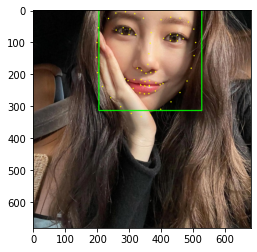

(358, 169)
(x,y) : (358,-10)
(w,h) : (322,322)
(322, 322, 3)


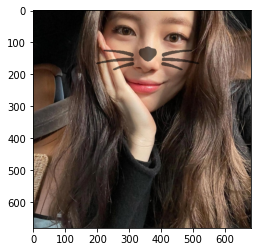

./images/test10.jpg


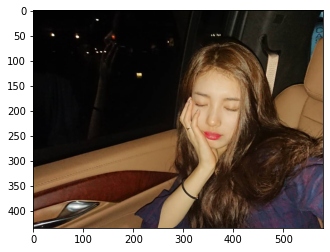

rectangles[[(296, 153) (425, 282)]]
68


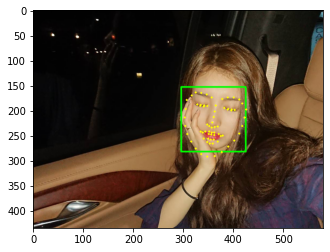

(358, 224)
(x,y) : (358,159)
(w,h) : (130,130)
(130, 130, 3)


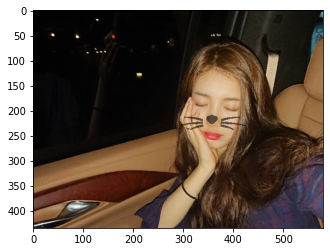

./images/test11.jpg


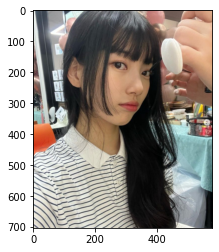

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_152/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/test12.jpg


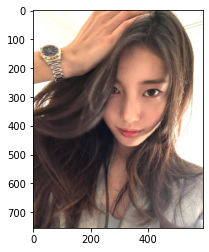

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_152/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/test13.jpg


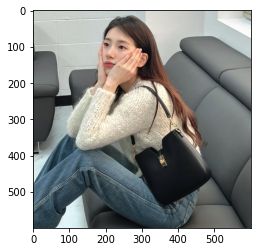

rectangles[[(175, 56) (282, 163)]]
68


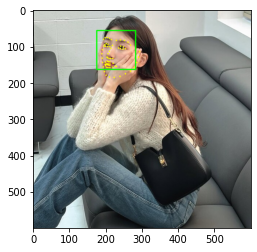

(206, 120)
(x,y) : (206,66)
(w,h) : (108,108)
(108, 108, 3)


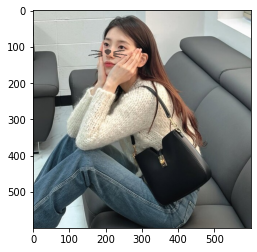

./images/test14.jpg


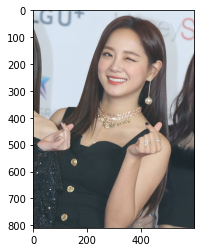

rectangles[[(221, 118) (407, 304)]]
68


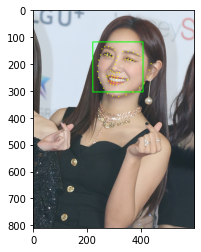

(299, 216)
(x,y) : (299,123)
(w,h) : (187,187)
(187, 187, 3)


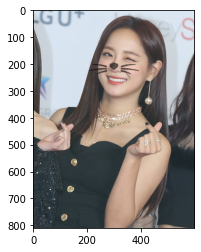

./images/test15.jpg


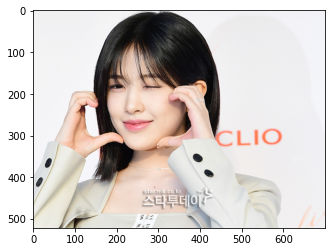

rectangles[[(159, 118) (345, 304)]]
68


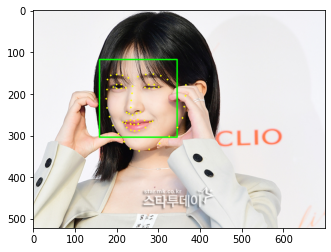

(234, 233)
(x,y) : (234,140)
(w,h) : (187,187)
(187, 187, 3)


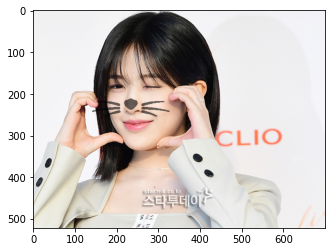

./images/test16.jpg


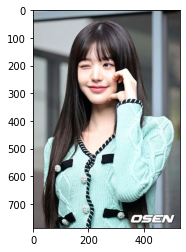

rectangles[[(150, 167) (304, 322)]]
68


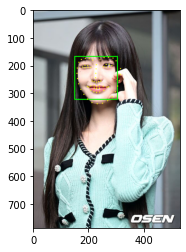

(225, 244)
(x,y) : (225,166)
(w,h) : (155,155)
(155, 155, 3)


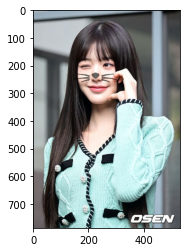

./images/test17.jpg


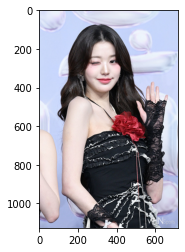

rectangles[[(242, 222) (428, 407)]]
68


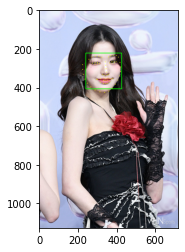

(349, 320)
(x,y) : (349,227)
(w,h) : (187,187)
(187, 187, 3)


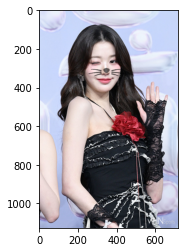

./images/test18.jpg


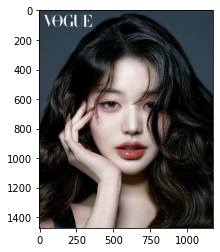

rectangles[[(356, 480) (911, 1035)]]
68


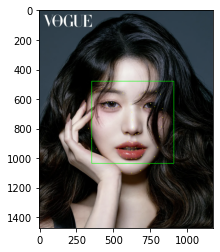

(639, 795)
(x,y) : (639,517)
(w,h) : (556,556)
(556, 556, 3)


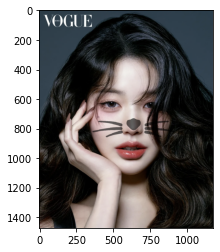

./images/test19.jpg


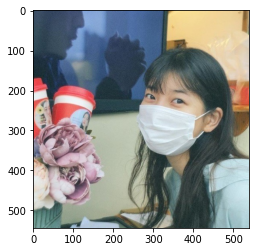

rectangles[[(242, 160) (428, 345)]]
68


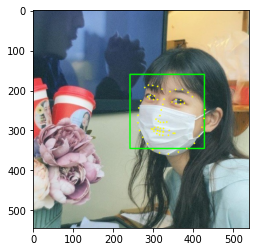

(317, 263)
(x,y) : (317,170)
(w,h) : (187,187)
(187, 187, 3)


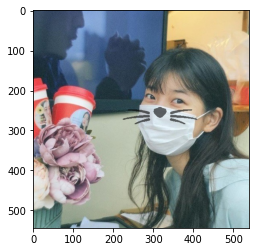

./images/test20.jpg


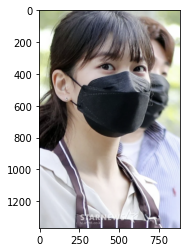

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_152/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


In [169]:
for i in range(1,21):
    my_image_path = './images/test' + str(i) + '.jpg'
    print(my_image_path)
    test_img = img_load(my_image_path)
    sticker_test(test_img)
    print('=============================================')

./images/cap1.jpg


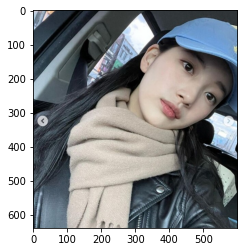

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_152/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/cap2.jpg


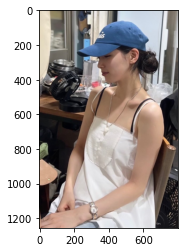

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_152/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/cap3.jpg


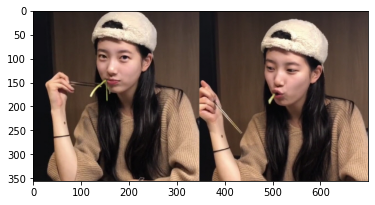

rectangles[[(115, 68) (223, 175)], [(462, 80) (569, 187)]]
68


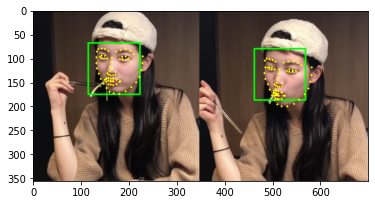

(160, 127)
(x,y) : (160,73)
(w,h) : (109,109)
(509, 151)
(x,y) : (509,97)
(w,h) : (108,108)
(108, 108, 3)


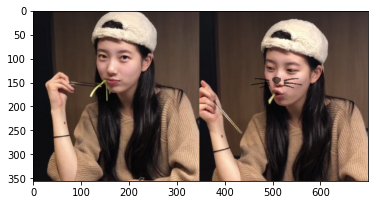

./images/cap4.jpg


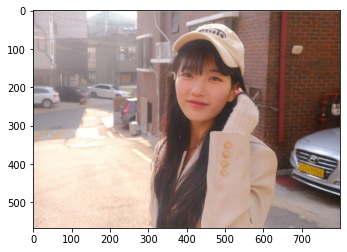

rectangles[[(356, 133) (511, 288)]]
68


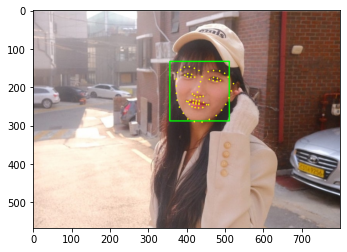

(428, 213)
(x,y) : (428,135)
(w,h) : (156,156)
(156, 156, 3)


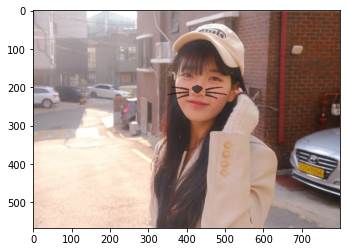

./images/cap5.jpg


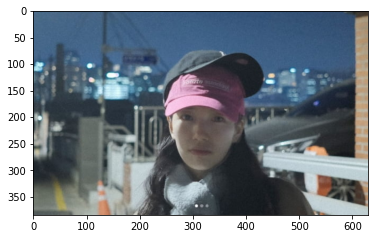

rectangles[[(253, 168) (382, 297)]]
68


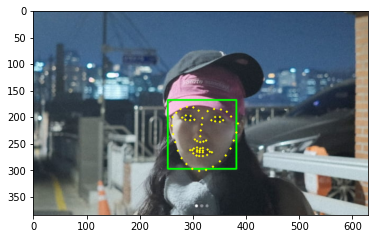

(314, 236)
(x,y) : (314,171)
(w,h) : (130,130)
(130, 130, 3)


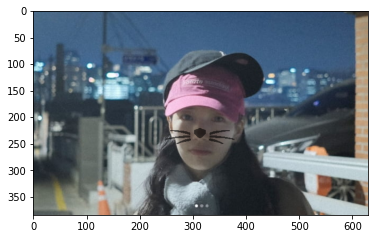

./images/cap6.jpg


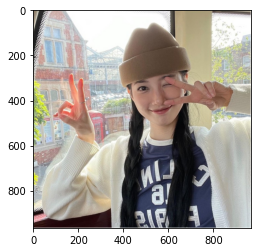

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_152/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/cap7.jpg


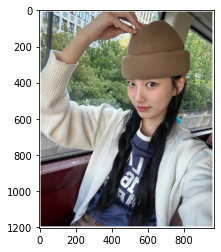

rectangles[[(438, 320) (706, 587)]]
68


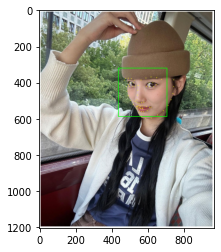

(540, 496)
(x,y) : (540,362)
(w,h) : (269,269)
(269, 269, 3)


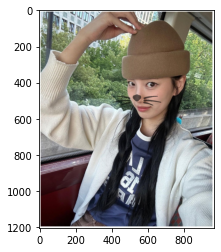

In [170]:
for i in range(1,8):
    my_image_path = './images/cap' + str(i) + '.jpg'
    print(my_image_path)
    test_img = img_load(my_image_path)
    sticker_test(test_img)
    print('=============================================')

./images/gls1.jpg


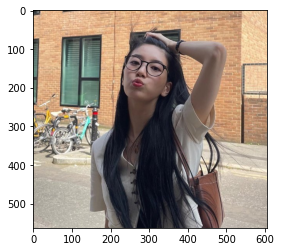

rectangles[[(210, 110) (339, 239)]]
68


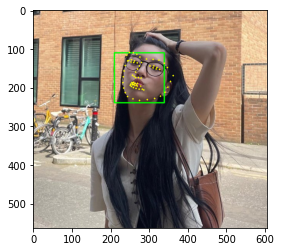

(265, 160)
(x,y) : (265,95)
(w,h) : (130,130)
(130, 130, 3)


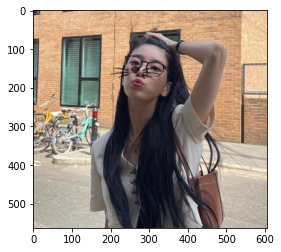

./images/gls2.jpg


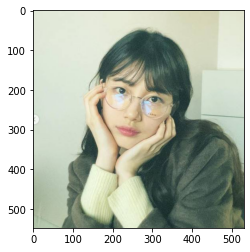

rectangles[[(159, 160) (345, 345)]]
68


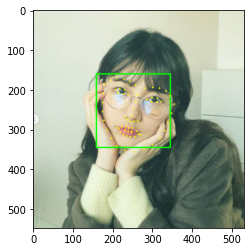

(248, 265)
(x,y) : (248,172)
(w,h) : (187,187)
(187, 187, 3)


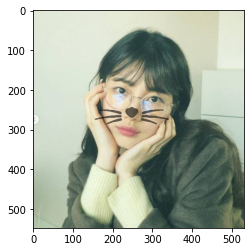

./images/gls3.jpg


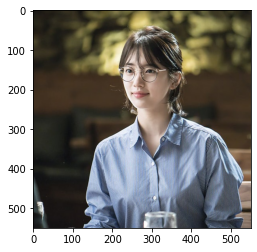

rectangles[[(210, 110) (339, 239)]]
68


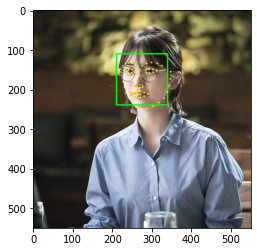

(260, 184)
(x,y) : (260,119)
(w,h) : (130,130)
(130, 130, 3)


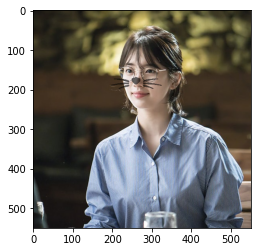

./images/gls4.jpg


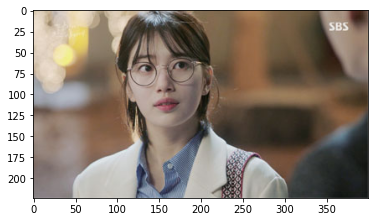

rectangles[[(116, 46) (205, 136)]]
68


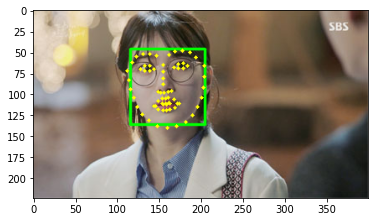

(155, 88)
(x,y) : (155,43)
(w,h) : (90,90)
(90, 90, 3)


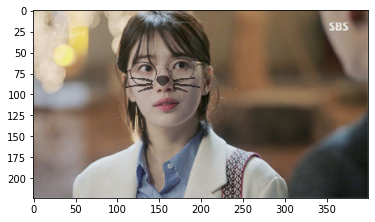

./images/gls5.jpg


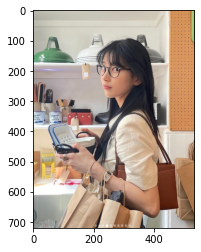

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_56/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/gls6.jpg


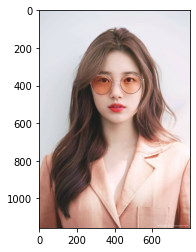

rectangles[[(241, 277) (562, 598)]]
68


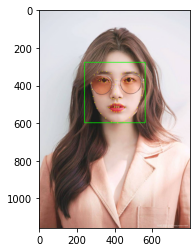

(404, 445)
(x,y) : (404,284)
(w,h) : (322,322)
(322, 322, 3)


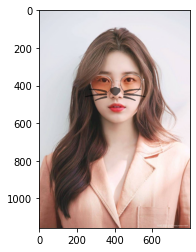

./images/gls7.jpg


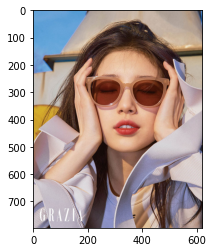

rectangles[[(170, 206) (491, 527)]]
68


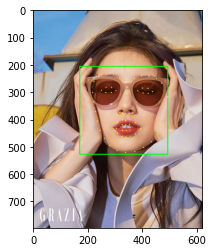

(337, 349)
(x,y) : (337,188)
(w,h) : (322,322)
(322, 322, 3)


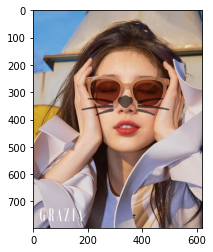

./images/gls8.jpg


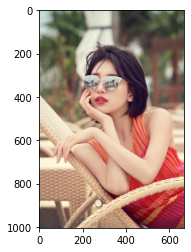

rectangles[[(201, 284) (386, 469)]]
68


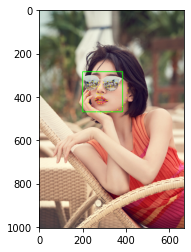

(272, 366)
(x,y) : (272,273)
(w,h) : (186,186)
(186, 186, 3)


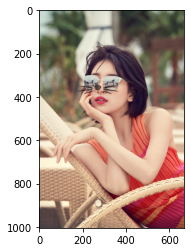

./images/gls9.jpg


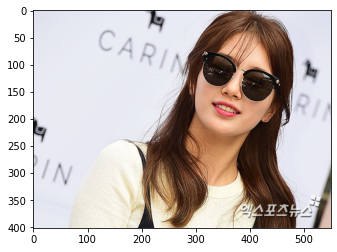

rectangles[[(287, 64) (442, 219)]]
68


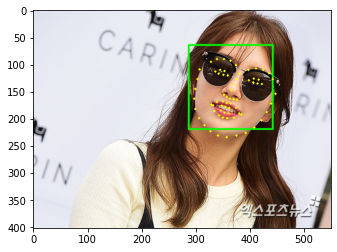

(366, 147)
(x,y) : (366,69)
(w,h) : (156,156)
(156, 156, 3)


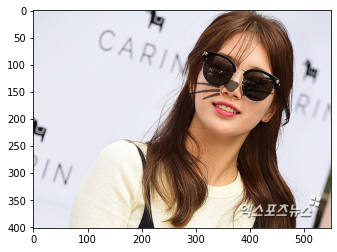

./images/gls10.jpg


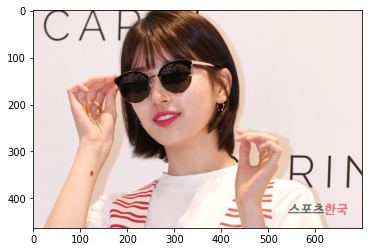

rectangles[[(180, 98) (366, 284)]]
68


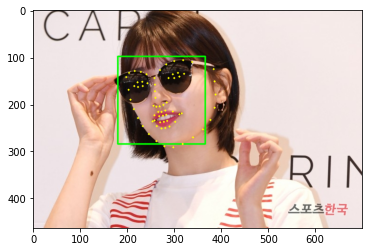

(260, 186)
(x,y) : (260,93)
(w,h) : (187,187)
(187, 187, 3)


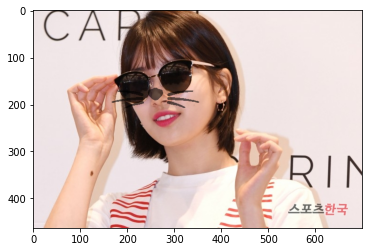

./images/gls11.jpg


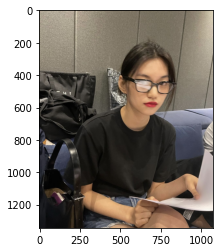

rectangles[[(557, 379) (825, 647)]]
68


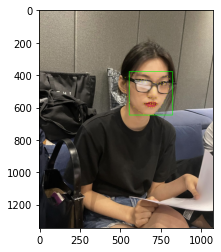

(710, 522)
(x,y) : (710,388)
(w,h) : (269,269)
(269, 269, 3)


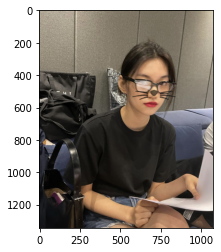

./images/gls12.jpg


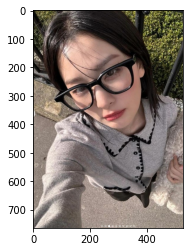

rectangles[[(111, 171) (379, 439)]]
68


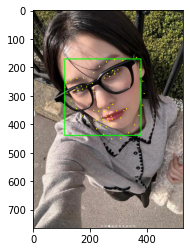

(235, 341)
(x,y) : (235,207)
(w,h) : (269,269)
(269, 269, 3)


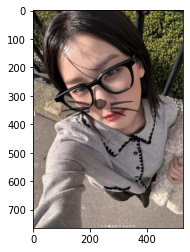

./images/gls13.jpg


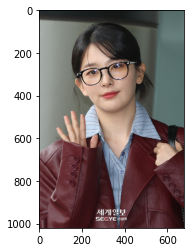

rectangles[[(171, 201) (438, 468)]]
68


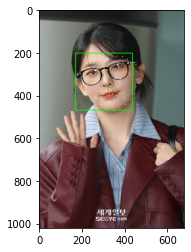

(314, 337)
(x,y) : (314,203)
(w,h) : (268,268)
(268, 268, 3)


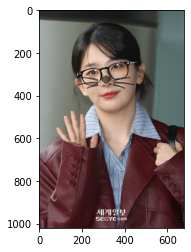

./images/gls14.jpg


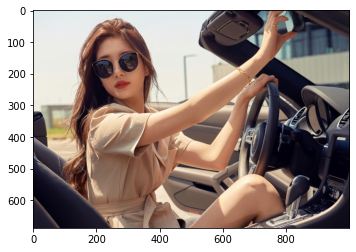

rectangles[[(180, 118) (366, 304)]]
68


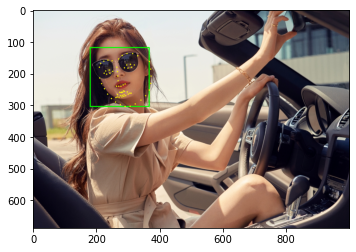

(268, 223)
(x,y) : (268,130)
(w,h) : (187,187)
(187, 187, 3)


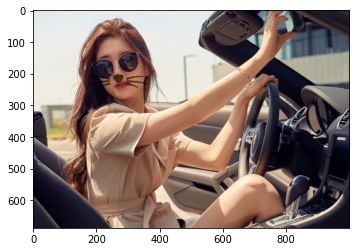

./images/gls15.jpg


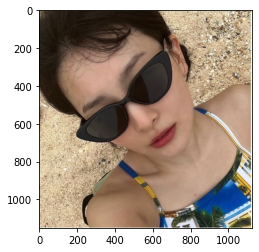

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_56/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


./images/gls16.jpg


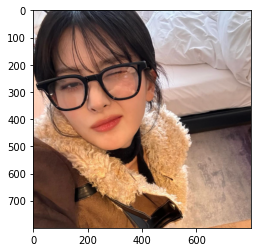

rectangles[[(98, 170) (419, 491)]]
68


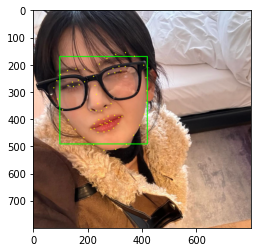

(237, 343)
(x,y) : (237,182)
(w,h) : (322,322)
(322, 322, 3)


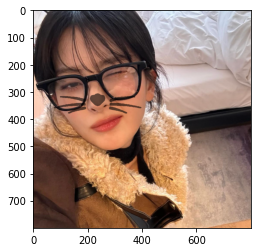

./images/gls17.jpg


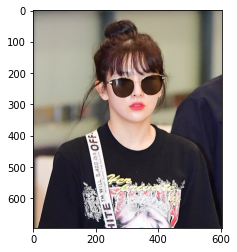

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_56/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


In [21]:
for i in range(1,18):
    my_image_path = './images/gls' + str(i) + '.jpg'
    print(my_image_path)
    test_img = img_load(my_image_path)
    sticker_test(test_img)
    print('=============================================')

### 여러 가지 사진을 테스트 해 본 결과

<실패>
- 얼굴 각도가 많이 기울어진 경우
- 얼굴이 많이 가려진 경우
- 옆모습

이미지 밝기와 촬영거리는 큰 영향을 미치는 것 같진 않음.
얼굴의 볼이나 이마와 같이 얼굴 일부가 가려져도 눈코입이 확실히 보이는 사진은 대부분 성공함.
눈을 감거나 안경과 선글라스로 인해 눈이 잘 보이지 않아도 얼굴을 잘 인식함.(윙크도 가능)
선글라스를 착용했을 때 눈이 아예 안 보이면 대부분 실패함.
눈코입이 가려져도 눈이 확실히 보이거나 코와 입이 확실히 보이는 등 가로로 가려진 경우 성공 확률이 높았음.
하지만 옆모습과 비슷하게 세로로 가려진 경우(눈이 하나만 보이는 경우)는 실패함.
얼굴의 각도가 대략 45도 이상 기울어진 경우 눈코입이 아주 잘 보이더라도 모두 실패함.

In [8]:
def rotate_image(img, ang):
    (h, w) = img.shape[:2]
    center = (w // 2, h // 2)

    # 회전행렬
    M = cv2.getRotationMatrix2D(center, ang, 1.0)
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])
    new_w = int((h * sin) + (w * cos))
    new_h = int((h * cos) + (w * sin))

    # 이미지의 중심을 기준으로 회전하도록 이동 시킴
    M[0, 2] += (new_w / 2) - center[0]
    M[1, 2] += (new_h / 2) - center[1]

    # 이미지 회전
    rotated = cv2.warpAffine(img, M, (new_w, new_h))
    return rotated

In [14]:
def face_detect_retry(img, ang):
    rotated_img = rotate_image(img, ang)
    sticker_test(rotated_img)

./images/test5.jpg


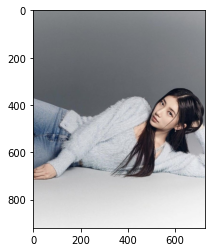

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_56/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


rectangles[[(626, 368) (755, 497)]]
68


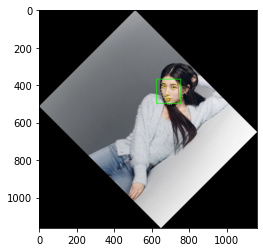

(677, 448)
(x,y) : (677,383)
(w,h) : (130,130)
(130, 130, 3)


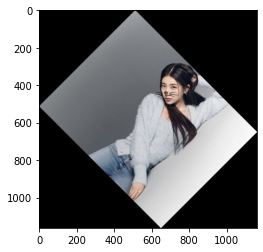

In [15]:
my_image_path = './images/test5.jpg'
print(my_image_path)
test_img = img_load(my_image_path)
flag = sticker_test(test_img)
if(flag == 0):
    face_detect_retry(test_img, 45)

./images/cap1.jpg


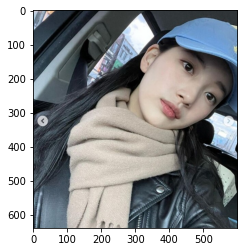

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_56/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


rectangles[[(349, 142) (617, 409)]]
68


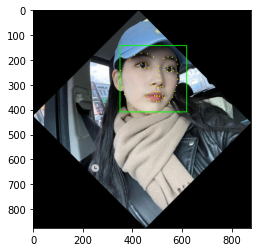

(511, 282)
(x,y) : (511,148)
(w,h) : (269,269)
(269, 269, 3)


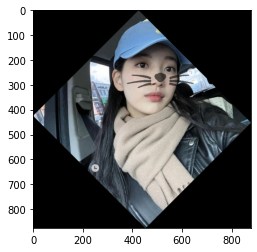

In [16]:
my_image_path = './images/cap1.jpg'
print(my_image_path)
test_img = img_load(my_image_path)
flag = sticker_test(test_img)
if(flag == 0):
    face_detect_retry(test_img, 45)

./images/gls15.jpg


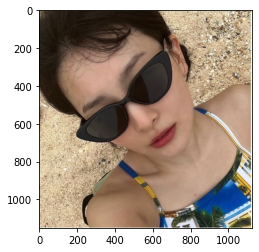

rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_56/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


rectangles[]
no landmark


Traceback (most recent call last):
  File "/tmp/ipykernel_56/3551101187.py", line 41, in sticker_test
    print(len(list_landmarks[0]))
IndexError: list index out of range


In [22]:
my_image_path = './images/gls15.jpg'
print(my_image_path)
test_img = img_load(my_image_path)
flag = sticker_test(test_img)
if(flag == 0):
    face_detect_retry(test_img, -45)

얼굴 각도로 인해 인식하지 못한 이미지는 각도를 돌려주니 잘 인식함.
마지막 gls15.jpg는 얼굴 각도보다는 선글라스로 인해 눈이 아예 안 보이는 영향이 더 커서 실패한 것 같음.

이외 옆모습과 얼굴이 많이 가려진 이미지는 dlib보다는 다른 모델을 사용하여야 할 것 같음.

### 회고
인공지능 기술이 발전하기 훨씬 이전부터 HOG라는 기술을 통해 얼굴을 인식해서 카메라의 초점을 잡는 기능에 활용되었다는 것이 신기했다.
지난 학기 그래픽스 수업에서 교수님이 마이클 잭슨의 'Black or White' 뮤비를 보여주시면서 잠깐 언급만 하셨던 기술이었는데
이번 기회에 직접 써볼 수 있어서 재밌었다.
cv를 공부할 때는 확실히 그래픽스에서 배우고 활용했던 기술들이 많이 언급되고 사용되어서 확실히 흥미로운 것 같다.
얼굴이 많이 가려진 이미지와 옆모습 이미지는 코드에 남기진 않았지만 좌우반전, 크기 확대/축소 등의 시도를 해보았는데
문제를 해결하진 못하였다. 이후 MediaPipe 등 다른 모델을 사용하여 이 문제를 해결해보고 싶다.
이 프로젝트를 더 발전시킨다면 사람의 얼굴 각도가 바뀌어도 그에 맞게 스티커도 회전하여 이미지에 적용되는 기능 등을 추가해보면 좋을 것 같다.